# Class Activation Maps Algorithms
***

### Installing and Importing Packages

In [ ]:
!pip install tf_explain

In [293]:
from sklearn.metrics import average_precision_score, confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score
from tensorflow.python.keras.utils.vis_utils import plot_model
from sklearn.model_selection import train_test_split
import explainability_algorithms as ea
import matplotlib.patches as mpatches
import occlusion_algorithms as oa
import matplotlib.pyplot as plt
import maps_binarization as mb
import prob_mask_in_seg as pms
import urllib.request as url
from zipfile import ZipFile
import tarfile, random, os
import matplotlib.cm as cm
import tensorflow as tf
import seaborn as sn
import pandas as pd
import numpy as np
import cv2

### Downloading the Data
* [The Oxford-IIIT Pet Dataset](https://www.robots.ox.ac.uk/~vgg/data/pets/)
***

In [3]:
url.urlretrieve(url = 'https://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz', 
                filename = 'images.tar.gz')
url.urlretrieve(url = 'https://www.robots.ox.ac.uk/~vgg/data/pets/data/annotations.tar.gz', 
                filename = 'annotations.tar.gz')
tarfile.open("/content/images.tar.gz").extractall('/content/')
tarfile.open("/content/annotations.tar.gz").extractall('/content/')

### Data Balancing (Oversampling Strategy)

In [25]:
image_files, index = os.listdir('/content/images'), list()

for i, image in enumerate(image_files):
  if image.split('.')[1] != 'jpg': index.append(i)
for i, j in enumerate(index): image_files.pop(j - i)

In [26]:
labels = list()
for image in image_files:
    if image[0].isupper(): labels.append(0) 
    else: labels.append(1)
        
labels = np.array(labels)
labels_one_hot = tf.keras.utils.to_categorical(labels, num_classes = 2, 
                                               dtype = np.float32())
decoder = {0: 'Gato', 1: 'Cachorro'}

In [27]:
dataframe = pd.DataFrame(image_files, columns=['Path'])
dataframe['Cats'], dataframe['Dogs'] = labels_one_hot[:, 0], labels_one_hot[:, 1]
dataframe.to_csv('cats_and_dogs.csv')

In [28]:
print(dataframe['Cats'].value_counts())
print(dataframe['Dogs'].value_counts())

0.0    4990
1.0    2400
Name: Cats, dtype: int64
1.0    4990
0.0    2400
Name: Dogs, dtype: int64


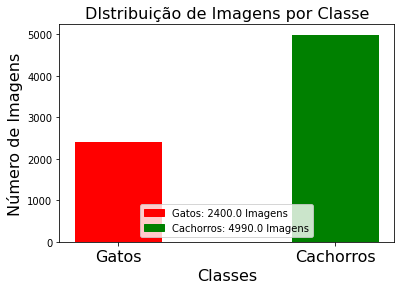

In [29]:
lenght_images = [np.sum(labels_one_hot[:, 0]), np.sum(labels_one_hot[:, 1])]
plt.bar(np.arange(0, 2), lenght_images, color = ['r', 'g'], width = 0.4)
plt.xlabel('Classes', size = 16), plt.ylabel('Número de Imagens', size = 16)
plt.title('DIstribuição de Imagens por Classe', size = 16)
plt.xticks([0, 1], ['Gatos', 'Cachorros'], size = 16)
cat = mpatches.Patch(color = 'red', label = f'Gatos: {str(lenght_images[0])} Imagens')
dog = mpatches.Patch(color = 'green', label = f'Cachorros: {str(lenght_images[1])} Imagens')
plt.legend(handles = [cat, dog], loc = 'lower center')

In [30]:
cats_df1, dogs_df = dataframe[dataframe['Cats'] == 1], dataframe[dataframe['Dogs'] == 1]
cats_df2 = cats_df1[0 : int(len(cats_df1) * 0.6)].sample(n = (len(dogs_df) - len(cats_df1)) // 2)
cats_df3 = cats_df1[int(len(cats_df1) * 0.4) : len(cats_df1)].sample(n = (len(dogs_df) - len(cats_df1)) // 2) 
cats_df = pd.concat((cats_df1, cats_df2, cats_df3))
dataframe_balanced = pd.concat((cats_df, dogs_df))
dataframe_balanced.to_csv('cats_and_dogs_oversampling.csv')

Text(0.5, 0.98, 'Estratégia Utilizada: Oversampling')

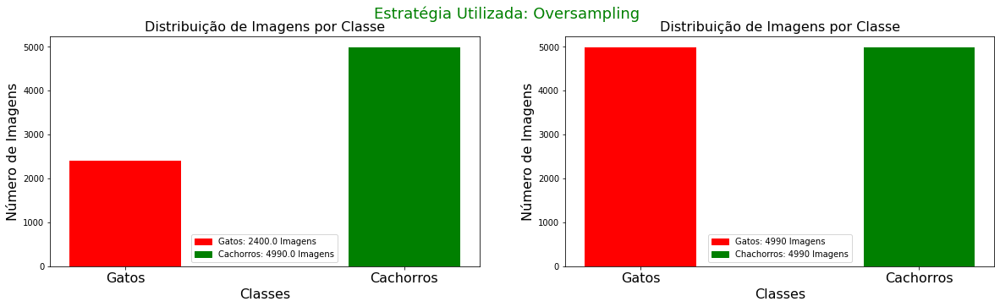

In [31]:
plt.figure(figsize = (20, 5))

plt.subplot(1, 2, 1)
lenght_images = [np.sum(labels_one_hot[:, 0]), np.sum(labels_one_hot[:, 1])]
plt.bar(np.arange(0, 2), lenght_images, color = ['r', 'g'], width = 0.4)
plt.xlabel('Classes', size = 16), plt.ylabel('Número de Imagens', size = 16)
plt.title('Distribuição de Imagens por Classe', size = 16)
plt.xticks([0, 1], ['Gatos', 'Cachorros'], size = 16)
cat = mpatches.Patch(color = 'red', label = f'Gatos: {lenght_images[0]} Imagens')
dog = mpatches.Patch(color = 'green', label = f'Cachorros: {lenght_images[1]} Imagens')
plt.legend(handles = [cat, dog], loc = 'lower center')

plt.subplot(1, 2, 2)
lenght_images = [cats_df.shape[0], dogs_df.shape[0]]
plt.bar(np.arange(0, 2), lenght_images, color = ['r', 'g'], width = 0.4)
plt.xlabel('Classes', size = 16), plt.ylabel('Número de Imagens', size = 16)
plt.title('Distribuição de Imagens por Classe', size = 16)
plt.xticks([0, 1], ['Gatos', 'Cachorros'], size = 16)
cat = mpatches.Patch(color = 'red', label = f'Gatos: {lenght_images[0]} Imagens')
dog = mpatches.Patch(color = 'green', label = f'Chachorros: {lenght_images[1]} Imagens')
plt.legend(handles = [cat, dog], loc = 'lower center')

plt.suptitle('Estratégia Utilizada: Oversampling', size = 18, color = 'green')

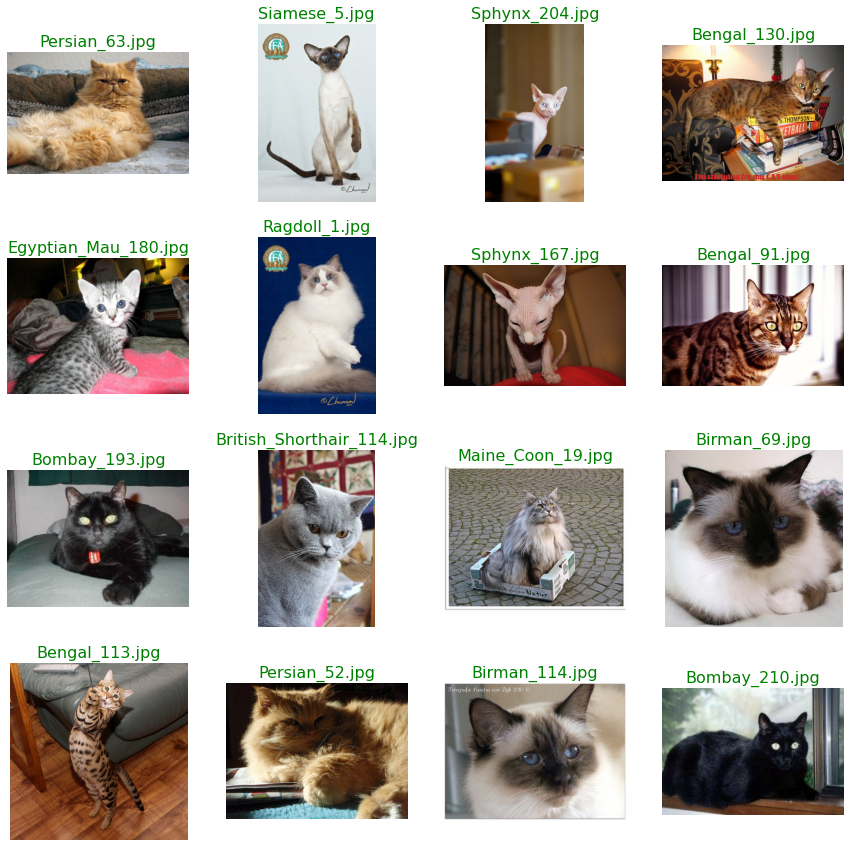

In [32]:
cats_images = np.array(cats_df['Path'])
fig, axs = plt.subplots(nrows = 4, ncols = 4, figsize = (15, 15))

for i in range(0, 4):
    for j in range(0, 4):
        count = random.randrange(0, 4989)
        image = plt.imread('/content/images/' + cats_images[count])
        axs[i, j].imshow(image, vmin = np.min(image), vmax = np.max(image))
        axs[i, j].set_title(cats_images[count], size = 16, color = 'green')
        axs[i, j].set_xlabel(image.shape, size = 12), axs[i, j].axis('off')

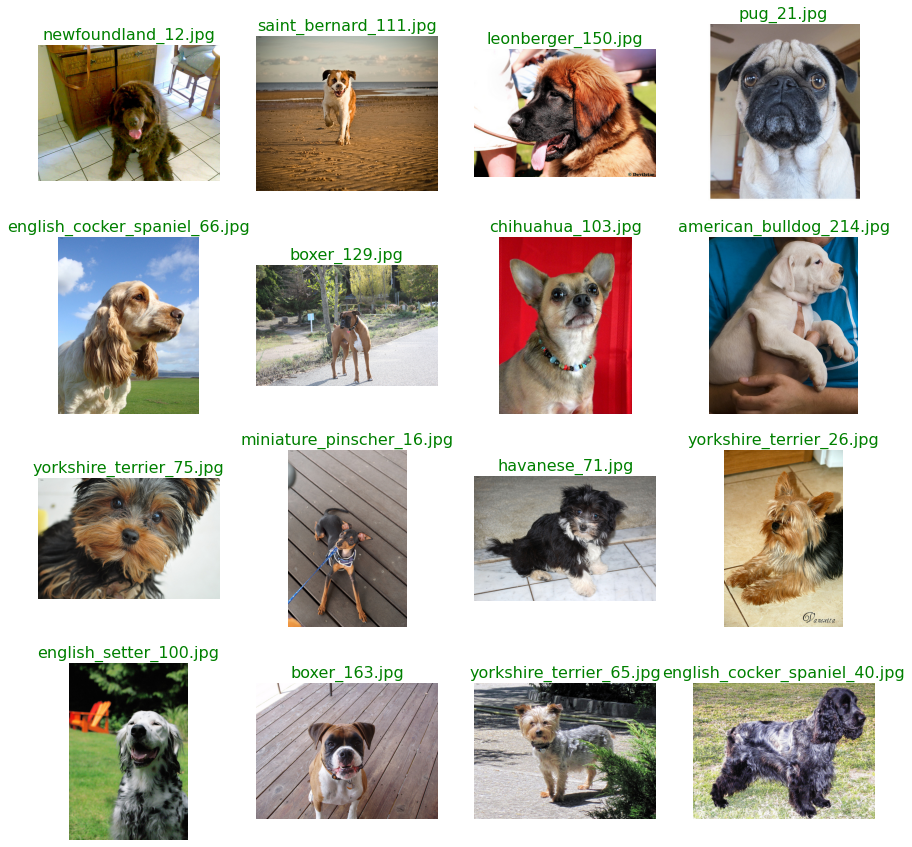

In [33]:
dogs_images = np.array(dogs_df['Path'])
fig, axs = plt.subplots(nrows = 4, ncols = 4, figsize = (15, 15))

for i in range(0, 4):
    for j in range(0, 4):
        count = random.randrange(0, 4989)
        image = plt.imread('/content/images/' + dogs_images[count])
        axs[i, j].imshow(image, vmin = np.min(image), vmax = np.max(image))
        axs[i, j].set_title(dogs_images[count], size = 16, color = 'green')
        axs[i, j].set_xlabel(image.shape, size = 12), axs[i, j].axis('off')

### Splitting the Image into Training, Validation, and Test Sets

In [34]:
train_df, test_df = train_test_split(dataframe_balanced, train_size = 0.8, random_state = 42, 
                                     shuffle = True, stratify = dataframe_balanced['Cats'])
test_df, val_df = train_test_split(test_df, test_size = 0.5, random_state = 42, shuffle = True, 
                                   stratify = test_df['Cats'])

In [35]:
print('Training Dataframe Images:', len(train_df), 'Images')
print('Dimension of the Validation Images:', len(val_df), 'Images')
print('Test Dataframe Images:', len(test_df), 'Images')

Training Dataframe Images: 7984 Images
Dimension of the Validation Images: 998 Images
Test Dataframe Images: 998 Images


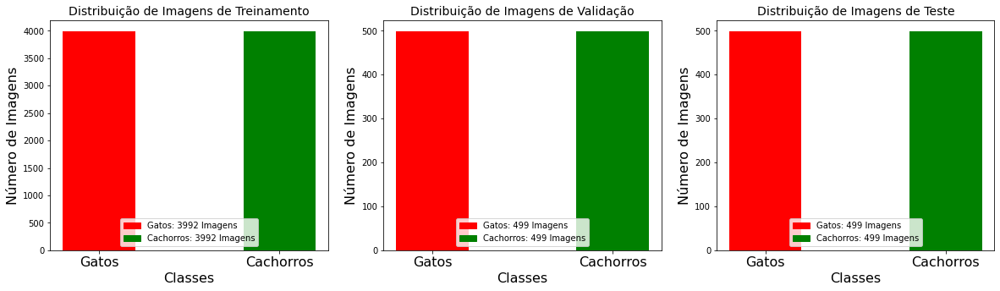

In [36]:
plt.figure(figsize = (20, 5))
references = ['Treinamento', 'Validação', 'Teste']

for index, values in enumerate([train_df, val_df, test_df]):

  plt.subplot(1, 3, index + 1)
  lenght_images = np.array(values['Cats'].value_counts())
  plt.bar(np.arange(0, 2), lenght_images, color = ['r', 'g'], width = 0.4)
  plt.xlabel('Classes', size = 16), plt.ylabel('Número de Imagens', size = 16)
  plt.title('Distribuição de Imagens de ' + references[index] , size = 14)
  plt.xticks([0, 1], ['Gatos', 'Cachorros'], size = 16)
  cat = mpatches.Patch(color = 'red', label = f'Gatos: {lenght_images[0]} Imagens')
  dog = mpatches.Patch(color = 'green', label = f'Cachorros: {lenght_images[1]} Imagens')
  plt.legend(handles = [cat, dog], loc = 'lower center')

In [37]:
data_augmentation = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255., 
                                                                    shear_range = 0.1,
                                                                    zoom_range = 0.25, 
                                                                    rotation_range = 16, 
                                                                    horizontal_flip = True, 
                                                                    width_shift_range = 0.1, 
                                                                    height_shift_range = 0.1, 
                                                                    fill_mode = 'constant')
original_data = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255.)

In [38]:
train_generator = data_augmentation.flow_from_dataframe(train_df, directory = '/content/images/',
                                                        x_col = 'Path', y_col = ['Cats', 'Dogs'], 
                                                        target_size = (128, 128), color_mode = 'rgb', 
                                                        class_mode = 'raw', batch_size = 64, 
                                                        shuffle = True, seed = 42) 

validation_generator = original_data.flow_from_dataframe(val_df, directory = '/content/images/',
                                                         x_col = 'Path', y_col = ['Cats', 'Dogs'], 
                                                         target_size = (128, 128), color_mode = 'rgb', 
                                                         class_mode = 'raw', batch_size = 64, 
                                                         shuffle = True, seed = 42) 

test_generator = original_data.flow_from_dataframe(test_df, 
                                                   directory = '/content/images/',
                                                   x_col = 'Path', y_col = ['Cats', 'Dogs'], 
                                                   target_size = (128, 128), color_mode = 'rgb', 
                                                   class_mode = 'raw', batch_size = 64, 
                                                   shuffle = True, seed = 42) 

Found 7984 validated image filenames.
Found 998 validated image filenames.
Found 998 validated image filenames.


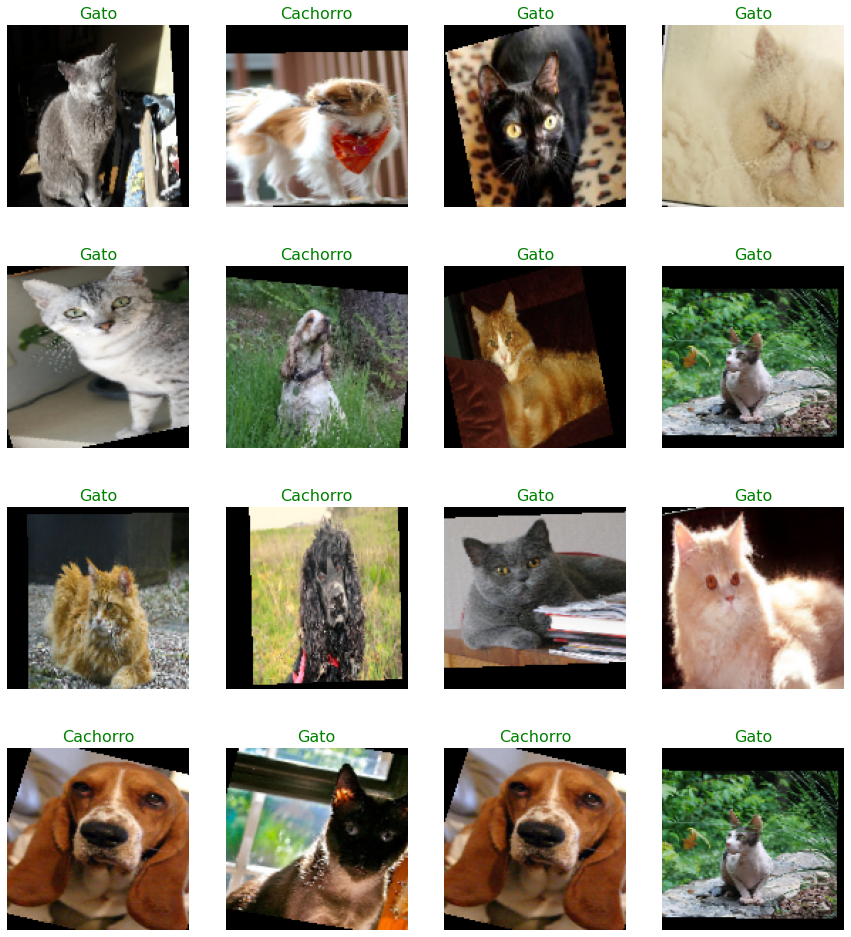

In [39]:
x, y = train_generator[random.randrange(0, len(train_generator))]
fig, axs = plt.subplots(nrows = 4, ncols = 4, figsize = (15, 17))

for i in range(0, 4):
    for j in range(0, 4):
        count = random.randrange(0, 64) 
        image = x[count]
        axs[i, j].imshow(image, vmin = np.min(image), vmax = np.max(image))
        axs[i, j].set_title(decoder[np.argmax(y[count])], size = 16, color = 'green')
        axs[i, j].set_xlabel(image.shape, size = 12), axs[i, j].axis('off')

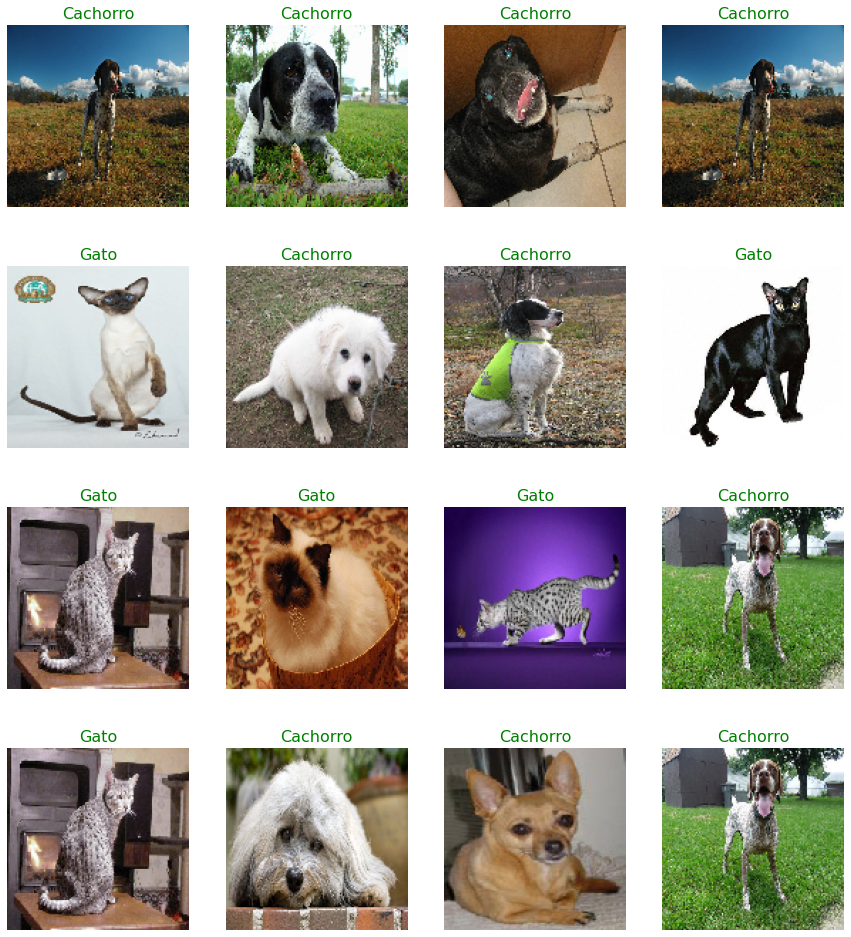

In [40]:
x, y = validation_generator[random.randrange(0, len(validation_generator))]
fig, axs = plt.subplots(nrows = 4, ncols = 4, figsize = (15, 17))

for i in range(0, 4):
    for j in range(0, 4):
        count = random.randrange(0, 64)
        image = x[count]
        axs[i, j].imshow(image, vmin = np.min(image), vmax = np.max(image))
        axs[i, j].set_title(decoder[np.argmax(y[count])], size = 16, color = 'green')
        axs[i, j].set_xlabel(image.shape, size = 12), axs[i, j].axis('off')

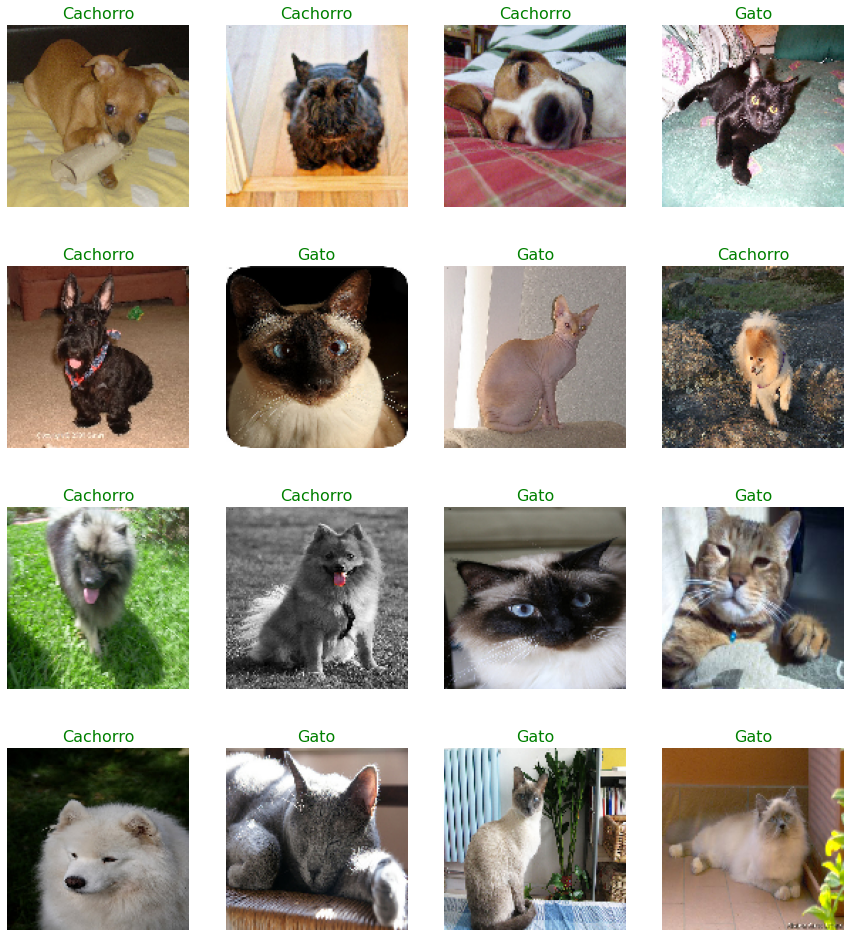

In [41]:
x, y = test_generator[random.randrange(0, len(test_generator))]
fig, axs = plt.subplots(nrows = 4, ncols = 4, figsize = (15, 17))

for i in range(0, 4):
    for j in range(0, 4):
        count = random.randrange(0, 64)
        image = x[count]
        axs[i, j].imshow(image, vmin = np.min(image), vmax = np.max(image))
        axs[i, j].set_title(decoder[np.argmax(y[count])], size = 16, color = 'green')
        axs[i, j].set_xlabel(image.shape, size = 12), axs[i, j].axis('off')

### Preparing the Convolutional Neural Network architecture

In [42]:
def convs_layers(input_shape):
    
    input_layer = tf.keras.layers.Input(shape = input_shape)
    x = tf.keras.layers.Conv2D(filters = 32, kernel_size = (3, 3), activation = 'relu')(input_layer)
    x = tf.keras.layers.MaxPooling2D(pool_size = (2, 2))(x)
    x = tf.keras.layers.Conv2D(filters = 64, kernel_size = (2, 2), activation = 'relu')(x)
    x = tf.keras.layers.MaxPooling2D(pool_size = (2, 2))(x)
    x = tf.keras.layers.Conv2D(filters = 128, kernel_size = (2, 2), activation = 'relu')(x)
    x = tf.keras.layers.MaxPooling2D(pool_size = (2, 2))(x)
    x = tf.keras.layers.Conv2D(filters = 256, kernel_size = (2, 2), activation = 'relu')(x)
    x = tf.keras.layers.MaxPooling2D(pool_size = (2, 2))(x)

    return input_layer, x 

In [43]:
def dense_layers(convs):

    x = tf.keras.layers.Flatten()(convs)
    x = tf.keras.layers.Dense(units = 256, activation = 'relu')(x)
    x = tf.keras.layers.Dense(units = 128, activation = 'relu')(x)
    x = tf.keras.layers.Dense(units = 64, activation = 'relu')(x)
    x = tf.keras.layers.Dropout(rate = 0.2)(x)
    x = tf.keras.layers.Dense(units = 2, activation = 'softmax')(x)
    
    return x

In [44]:
def final_model(input_shape):
    
    input_layer, convs = convs_layers(input_shape)
    output_layer = dense_layers(convs)
    
    return tf.keras.models.Model(inputs = input_layer, outputs = output_layer)

In [45]:
def compile(model):

    return model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', 
                         metrics = ['acc'])

In [46]:
model = final_model((128, 128, 3))
compile(model)

### Organizing Convolutional Neural Network Callbacks

In [47]:
csv_history = tf.keras.callbacks.CSVLogger('history_train_oversampling.csv', 
                                           separator = ',', append = False)
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'weights_oversampling.hdf5', 
                                                monitor = 'val_acc', 
                                                verbose = True, save_best_only = True, 
                                                save_weights_only = True, mode = 'max')
callbacks = [csv_history, checkpoint]

### Convolutional Neural Network Training

In [ ]:
model.fit(train_generator, batch_size = 64, epochs = 50, verbose = True, 
          callbacks = callbacks, validation_data = validation_generator, shuffle = True, 
          validation_batch_size = 64, use_multiprocessing = True, workers = 4)

(Text(0.5, 0, 'Épocas'),
 Text(0, 0.5, 'Acurácia'),
 <matplotlib.legend.Legend at 0x7f5e65817450>)

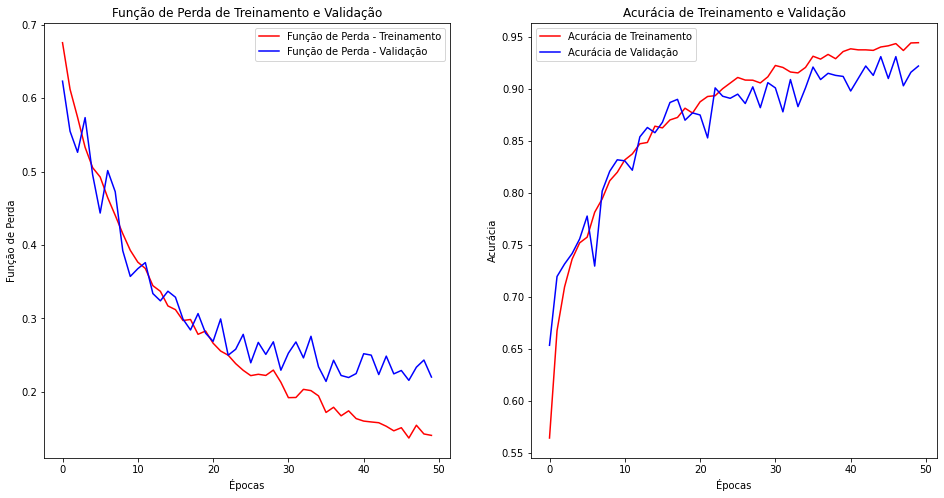

In [50]:
history = pd.read_csv('/content/history_train_oversampling.csv', delimiter = ',',
                       usecols = ['epoch', 'acc', 'loss', 'val_acc', 'val_loss'])

acc, loss = list(history['acc']), list(history['loss'])
val_acc, val_loss = list(history['val_acc']), list(history['val_loss'])
epoch = list(history['epoch'])

fig, axes = plt.subplots(1, 2, squeeze = False, figsize = (16, 8))

ax = axes.flat[0]
ax.plot(epoch, loss, "r", label = "Função de Perda - Treinamento")
ax.plot(epoch, val_loss, "b", label = "Função de Perda - Validação")
ax.set_title("Função de Perda de Treinamento e Validação")
ax.set_xlabel("Épocas"), ax.set_ylabel("Função de Perda"), ax.legend()

ax = axes.flat[1]
ax.plot(epoch, acc, "r", label = "Acurácia de Treinamento")
ax.plot(epoch, val_acc, "b", label = "Acurácia de Validação")
ax.set_title("Acurácia de Treinamento e Validação")
ax.set_xlabel("Épocas"), ax.set_ylabel("Acurácia"), ax.legend()

In [ ]:
model.load_weights('/content/weights_oversampling.hdf5')
model.save('cats_vs_dogs_model_oversampling')
!zip -r /content/cats_vs_dogs_model_oversampling.zip /content/cats_vs_dogs_model_oversampling

### Developed Model Evaluation Metrics

In [ ]:
metrics = model.evaluate(test_generator)

In [77]:
for index in range (0, (len(test_df) // 64) + 1):
  if index == 0: 
    x0, y0 = test_generator[index]
  else:
    x, y = test_generator[index]
    x0, y0 = np.concatenate((x0, x)), np.concatenate((y0, y))

labels_pred = model.predict(x0)

Text(0.5, 1.0, 'Confusion Matrix')

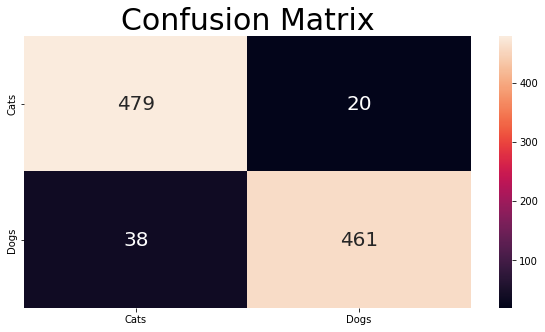

In [78]:
confusion_ma = confusion_matrix(np.argmax(y0, axis = 1), np.argmax(labels_pred, axis = 1))
df_cm = pd.DataFrame(confusion_ma, index = ['Cats', 'Dogs'], columns = ['Cats', 'Dogs'])
plt.figure(figsize = (10, 5))
sn.heatmap(df_cm, annot = True, annot_kws = {"size": 20}, fmt = 'g')
plt.title('Confusion Matrix', size = 30)

In [79]:
average = average_precision_score(np.argmax(y0, axis = 1), np.argmax(labels_pred, axis = 1))
precision = precision_score(np.argmax(y0, axis = 1), np.argmax(labels_pred, axis = 1))
recall = recall_score(np.argmax(y0, axis = 1), np.argmax(labels_pred, axis = 1))
f1 = f1_score(np.argmax(y0, axis = 1), np.argmax(labels_pred, axis = 1))

print('Average: {:.2f}%'.format(average * 100))
print('Precision: {:.2f}%'.format(precision * 100))
print('Recall: {:.2f}%'.format(recall * 100))
print('F1_score: {:.2f}%'.format(f1 * 100))

Average: 92.35%
Precision: 95.84%
Recall: 92.38%
F1_score: 94.08%


### Explainability Algorithms

In [56]:
model_grad = ea.copy_model(model)
ref_images = list(test_df['Path'])

INFO:tensorflow:Assets written to: ram://69e2217e-52c3-4576-a6f9-0c13980d6faa/assets


In [57]:
def label_predict(pred):
  '''
  labels the model predictions vector

  Args:
    pred (array) --> model prediction vector
  
  Returns:
    label (str) --> prediction label
  '''

  argmax = np.argmax(pred)
  if argmax == 0: label = 'Gato'
  else: label = 'Cachorro'

  return label

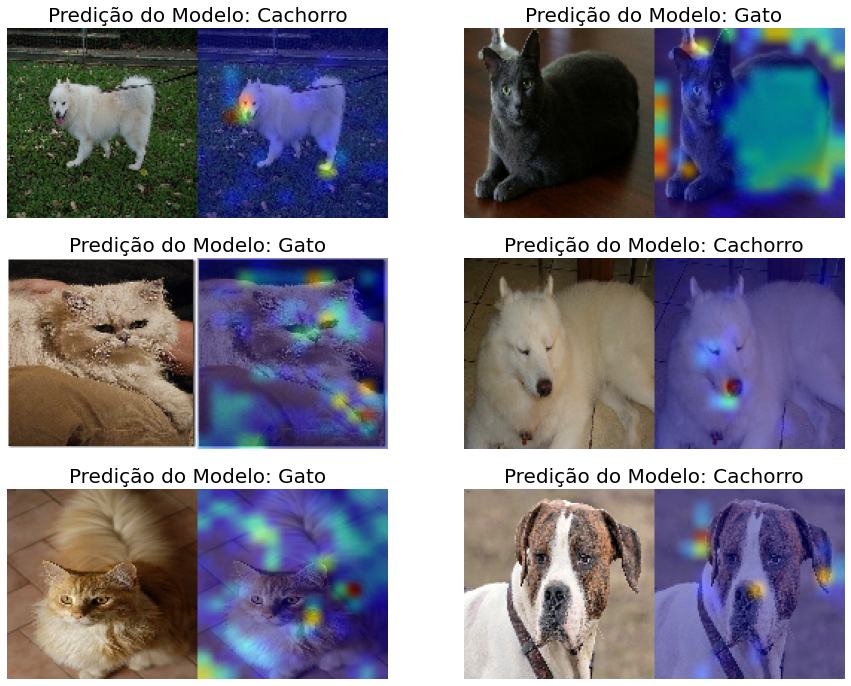

In [94]:
fig, axs = plt.subplots(nrows = 3, ncols = 2, figsize = (15, 12))
for i in range(0, 3):
  for j in range(0, 2):
    
    count = random.randrange(0, len(ref_images))
    img_a = ea.get_img_array(img_path = '/content/images/' + ref_images[count], 
                             target_size = (128, 128))
    _, img_b = ea.get_grad_cam(img_array = img_a, copy_model = model_grad, 
                               last_conv_layer_name = 'conv2d_3', alpha = 0.9)

    img_concatenate = np.concatenate((img_a[0], img_b), axis = 1)
    axs[i][j].imshow(img_concatenate, vmin = np.min(img_concatenate), 
                  vmax = np.max(img_concatenate))
    pred = model.predict(img_a)
    axs[i][j].set_title('Predição do Modelo: ' + label_predict(pred = pred[0]), fontsize = 20)
    axs[i][j].axis('off')

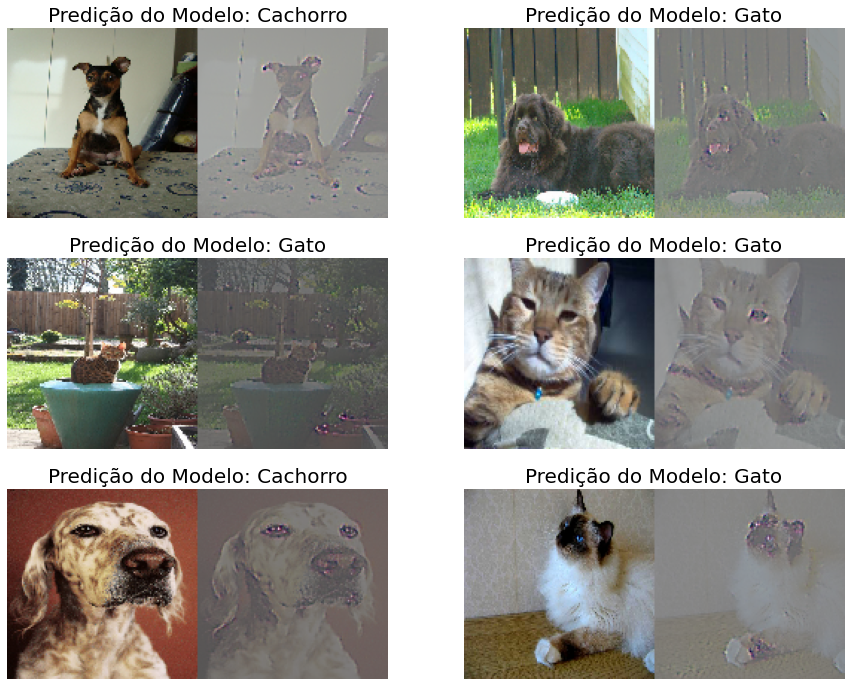

In [91]:
fig, axs = plt.subplots(nrows = 3, ncols = 2, figsize = (15, 12))
for i in range(0, 3):
  for j in range(0, 2):

    count = random.randrange(0, len(ref_images))
    img_a = ea.get_img_array(img_path = '/content/images/' + ref_images[count], 
                            target_size = (128, 128))
    img_b = ea.guided_backpropagation(img_array = img_a, model = model, 
                                      last_conv_layer_name = 'conv2d_3')
    img_mask = (img_a[0] * 0.2 + img_b) / np.max(img_a[0] * 0.2 + img_b)
    img_concatenate = np.concatenate((img_a[0], img_mask), axis = 1)
    axs[i][j].imshow(img_concatenate, vmin = np.min(img_concatenate), 
                  vmax = np.max(img_concatenate))
    pred = model.predict(img_a)
    axs[i][j].set_title('Predição do Modelo: ' + label_predict(pred = pred[0]), fontsize = 20)
    axs[i][j].axis('off')

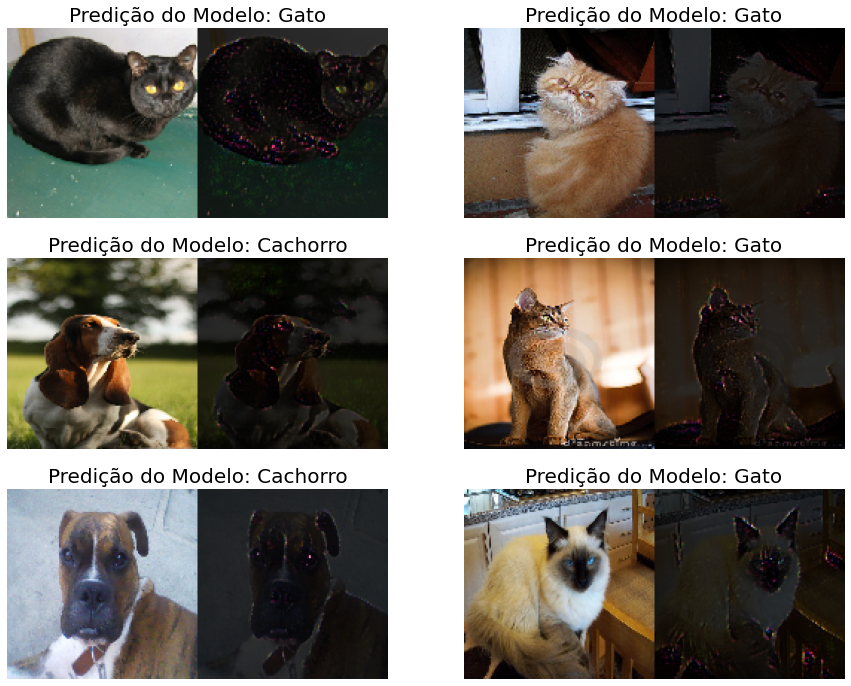

In [96]:
fig, axs = plt.subplots(nrows = 3, ncols = 2, figsize = (15, 12))
for i in range(0, 3):
  for j in range(0, 2):
    
    count = random.randrange(0, len(ref_images))
    img_a = ea.get_img_array(img_path = '/content/images/' + ref_images[count], 
                             target_size = (128, 128))
    img_b = ea.guided_grad_cam(img_array = img_a, model = model, 
                               last_conv_layer_name = 'conv2d_3', copy_model = model_grad, 
                               alpha = 0.9)
    img_mask = (img_a[0] * 0.2 + img_b) / np.max(img_a[0] * 0.2 + img_b)
    img_concatenate = np.concatenate((img_a[0], img_mask), axis = 1)
    axs[i][j].imshow(img_concatenate, vmin = np.min(img_concatenate), 
                  vmax = np.max(img_concatenate))
    pred = model.predict(img_a)
    axs[i][j].set_title('Predição do Modelo: ' + label_predict(pred = pred[0]), fontsize = 20)
    axs[i][j].axis('off')

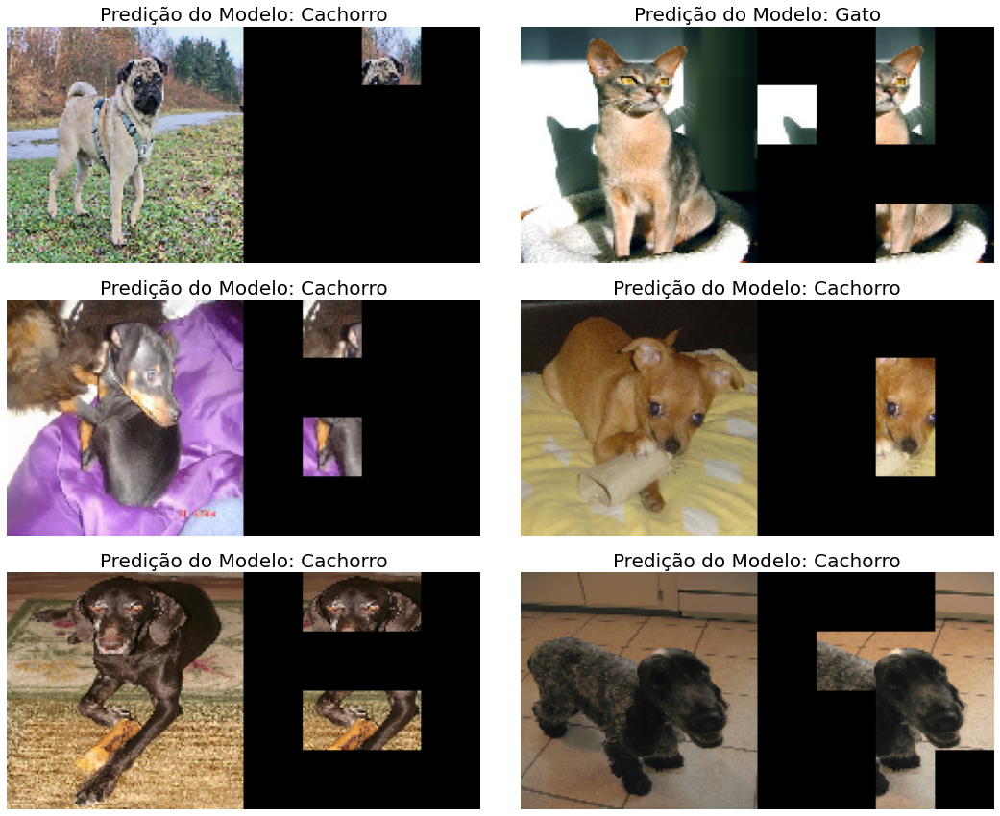

In [199]:
fig, axs = plt.subplots(nrows = 3, ncols = 2, figsize = (15, 12))
plt.tight_layout()
for i in range(0, 3):
  for j in range(0, 2):

    count = random.randrange(0, len(ref_images))
    img_a = ea.get_img_array(img_path = '/content/images/' + ref_images[count], 
                             target_size = (128, 128))
    img_b = oa.occlusion_prediction(img_array = img_a, patch_size = 32, channels = 3,
                                    patches_dims = (4, 4), model = model, val_occlusion = 0)

    img_concatenate = np.concatenate((img_a[0], img_b), axis = 1)
    axs[i][j].imshow(img_concatenate, vmin = np.min(img_concatenate), 
                     vmax = np.max(img_concatenate))
    pred = model.predict(img_a)
    axs[i][j].set_title('Predição do Modelo: ' + label_predict(pred = pred[0]), fontsize = 20)
    axs[i][j].axis('off')

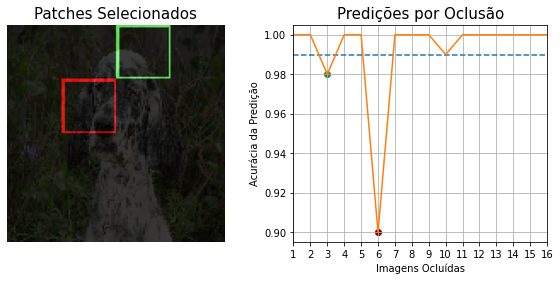

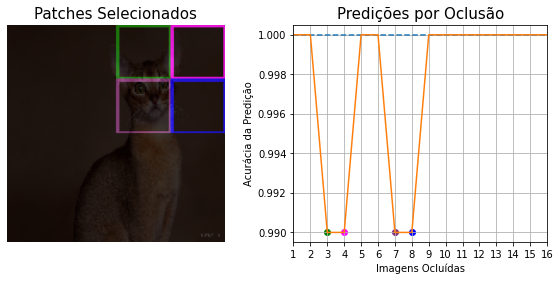

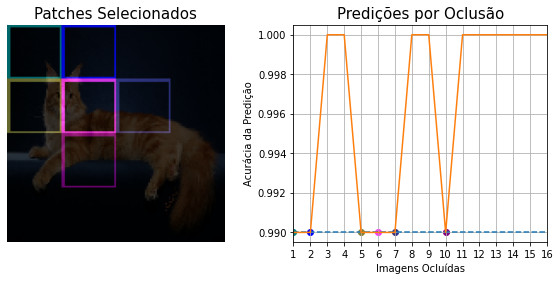

In [209]:
for i in range(0, 3):
    count = random.randrange(0, len(ref_images))
    img_a = ea.get_img_array(img_path = '/content/images/' + ref_images[count], 
                            target_size = (128, 128))
    oa.occlusion_prediction_plot(img_a, patch_size = 32, channels = 3, 
                                 patches_dims = (4, 4), model = model, val_occlusion = 0)

### Quantify the Quality of Class Activation Maps

In [166]:
test_images = list(test_df['Path'])

#### First Binarization Method

In [237]:
test_grad, test_back, test_guided, test_occlusion = [], [], [], []

for image in test_images:

  path_seg = '/content/annotations/trimaps/' + image.replace('jpg', 'png')
  path_img = '/content/images/' + image
  img_array = ea.get_img_array(img_path = path_img, target_size = (128, 128))

  seg_mask = mb.extract_annotations(img_path = path_seg, target_size = (128, 128))
  gradcam_mask = mb.extract_gradcam(img_array = img_array, last_conv_layer_name = 'conv2d_3', 
                                    copy_model = model_grad)
  back_mask = mb.extract_backpropagation(img_array = img_array, model = model, 
                                         copy_model = model_grad, 
                                         last_conv_layer_name = 'conv2d_3', 
                                         type = 'guided_backpropagation')
  guidedgrad_mask = mb.extract_backpropagation(img_array = img_array, model = model, 
                                               copy_model = model_grad, 
                                               last_conv_layer_name = 'conv2d_3', 
                                               type = 'guided_gradcam')
  occlusion_mask = mb.extract_occlusion(img_array = img_array, patch_size = 32, channels = 3,
                                        patches_dims = (4, 4), model = model, val_occlusion = 0)
  
  test_grad.append(pms.intersect_seg_map_prob(image_segmentation = seg_mask, 
                                              image_map = gradcam_mask))
  test_back.append(pms.intersect_seg_map_prob(image_segmentation = seg_mask, 
                                              image_map = back_mask))
  test_guided.append(pms.intersect_seg_map_prob(image_segmentation = seg_mask, 
                                                image_map = guidedgrad_mask))
  test_occlusion.append(pms.intersect_seg_map_prob(image_segmentation = seg_mask, 
                                                   image_map = occlusion_mask))

test_grad = np.array(test_grad)
test_back = np.array(test_back)
test_guided = np.array(test_guided)
test_occlusion = np.array(test_occlusion) 

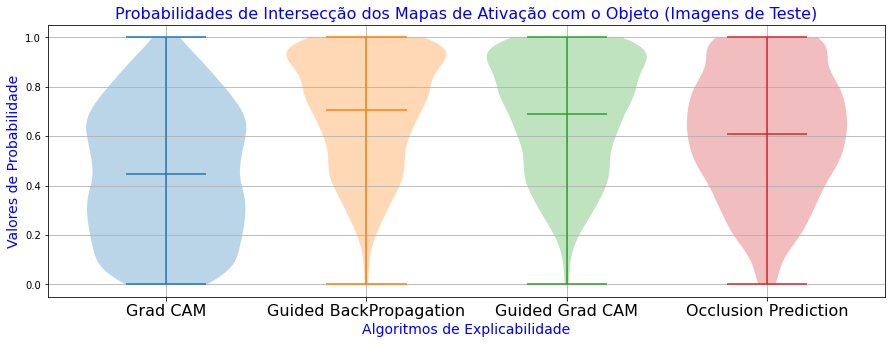

In [238]:
plt.figure(figsize = (15, 5))

plt.violinplot(test_grad, positions = [1], showmeans = True, widths = 0.8)
plt.violinplot(test_back, positions = [2], showmeans = True, widths = 0.8)
plt.violinplot(test_guided, positions = [3], showmeans = True, widths = 0.8)
plt.violinplot(test_occlusion, positions = [4], showmeans = True, widths = 0.8)

x_labels = ['Grad CAM', 'Guided BackPropagation', 'Guided Grad CAM', 'Occlusion Prediction']
plt.xticks(ticks = [1, 2, 3, 4], labels = x_labels, size = 16, color = 'black')
plt.xlabel('Algoritmos de Explicabilidade', 
           size = 14, color = 'blue')
plt.ylabel('Valores de Probabilidade', size = 14, color = 'blue')
plt.title('Probabilidades de Intersecção dos Mapas de Ativação com o Objeto (Imagens de Teste)', 
          size = 16, color = 'blue')
plt.grid(True)

In [242]:
mean_tgc = np.mean(test_grad) 
mean_tgb = np.mean(test_back)
mean_tggc = np.mean(test_guided) 
mean_op = np.mean(test_occlusion)

print('Average of aProbabilities (Test Images)')
print('Grad CAM: {:.2f}%'.format(mean_tgc * 100))
print('Guided BackPropagation: {:.2f}%'.format(mean_tgb * 100))
print('Guided Grad CAM: {:.2f}%'.format(mean_tggc * 100))
print('Occlusion Prediction: {:.2f}%'.format(mean_op * 100))

Average of aProbabilities (Test Images)
Grad CAM: 44.85%
Guided BackPropagation: 70.66%
Guided Grad CAM: 68.88%
Occlusion Prediction: 60.92%


#### Second Binarization Method

In [290]:
test_grad, test_back, test_guided, test_occlusion = [], [], [], []

for image in test_images:

  path_seg = '/content/annotations/trimaps/' + image.replace('jpg', 'png')
  path_img = '/content/images/' + image
  img_array = ea.get_img_array(img_path = path_img, target_size = (128, 128))

  seg_mask = mb.extract_annotations(img_path = path_seg, target_size = (128, 128))
  gradcam_mask = mb.extract_gradcam_otsu(img_array = img_array, last_conv_layer_name = 'conv2d_3', 
                                         copy_model = model_grad)
  back_mask = ~mb.extract_backpropagation_otsu(img_array = img_array, model = model, 
                                               copy_model = model_grad, 
                                               last_conv_layer_name = 'conv2d_3', 
                                               type = 'guided_backpropagation')
  guidedgrad_mask = mb.extract_backpropagation_otsu(img_array = img_array, model = model, 
                                                    copy_model = model_grad, 
                                                    last_conv_layer_name = 'conv2d_3', 
                                                    type = 'guided_gradcam')
  occlusion_mask = mb.extract_occlusion_otsu(img_array = img_array, patch_size = 32, channels = 3,
                                     patches_dims = (4, 4), model = model, val_occlusion = 0)
  
  test_grad.append(pms.intersect_seg_map_prob(image_segmentation = seg_mask, 
                                              image_map = gradcam_mask))
  test_back.append(pms.intersect_seg_map_prob(image_segmentation = seg_mask, 
                                              image_map = back_mask))
  test_guided.append(pms.intersect_seg_map_prob(image_segmentation = seg_mask, 
                                                image_map = guidedgrad_mask))
  test_occlusion.append(pms.intersect_seg_map_prob(image_segmentation = seg_mask, 
                                                   image_map = occlusion_mask))

test_grad = np.array(test_grad)
test_back = np.array(test_back)
test_guided = np.array(test_guided)
test_occlusion = np.array(test_occlusion) 

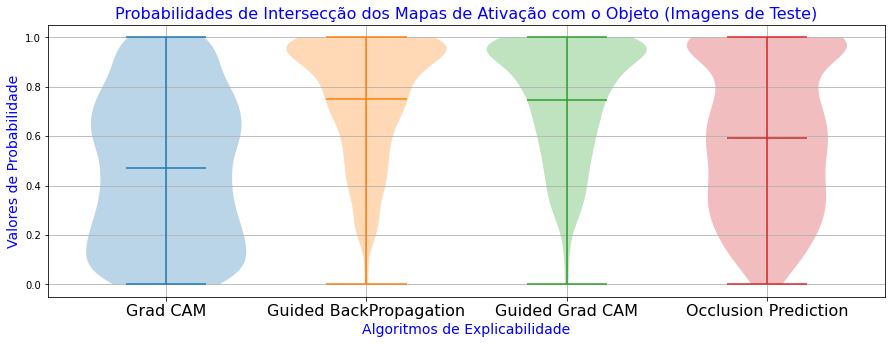

In [291]:
plt.figure(figsize = (15, 5))

plt.violinplot(test_grad, positions = [1], showmeans = True, widths = 0.8)
plt.violinplot(test_back, positions = [2], showmeans = True, widths = 0.8)
plt.violinplot(test_guided, positions = [3], showmeans = True, widths = 0.8)
plt.violinplot(test_occlusion, positions = [4], showmeans = True, widths = 0.8)

x_labels = ['Grad CAM', 'Guided BackPropagation', 'Guided Grad CAM', 'Occlusion Prediction']
plt.xticks(ticks = [1, 2, 3, 4], labels = x_labels, size = 16, color = 'black')
plt.xlabel('Algoritmos de Explicabilidade', 
           size = 14, color = 'blue')
plt.ylabel('Valores de Probabilidade', size = 14, color = 'blue')
plt.title('Probabilidades de Intersecção dos Mapas de Ativação com o Objeto (Imagens de Teste)', 
          size = 16, color = 'blue')
plt.grid(True)

In [292]:
mean_tgc = np.mean(test_grad) 
mean_tgb = np.mean(test_back) 
mean_tggc = np.mean(test_guided) 
mean_op = np.mean(test_occlusion)

print('Average of aProbabilities (Test Images)')
print('Grad CAM: {:.2f}%'.format(mean_tgc * 100))
print('Guided BackPropagation: {:.2f}%'.format(mean_tgb * 100))
print('Guided Grad CAM: {:.2f}%'.format(mean_tggc * 100))
print('Occlusion Prediction: {:.2f}%'.format(mean_op * 100))

Average of aProbabilities (Test Images)
Grad CAM: 47.11%
Guided BackPropagation: 75.17%
Guided Grad CAM: 74.83%
Occlusion Prediction: 59.41%
